# 1. Introduction:

This notebook aims to explore tweets mentioning @Dell and perform sentiment analysis to gain insights into the positive and negative aspects of the company's products and services. (Kaggle Practice)

1. Loading Data
2. Exploratory Data Analysis
3. Data Preprocessing
    3.1 Cleaning the Corpus
   3.2 Stemming
   3.3 All Together
   3.4 Target Encoding
4. Tokens Visualization
5. Vectorization
   5.1 Tuning CountVectorizer
   5.2 TF-IDF
   5.3 Word Embeddings: Glove
6. Modeling
   6.1 Naive Bayes DTM
   6.2 Naive Bayes TF-IDF
   6.3 XGBoost
7. LSTM
8. BERT
9. NLP: Disaster Tweets
   9.1 EDA
   9.2 Data Preprocessing
   9.3 WordCloud
   9.4 Modeling
   9.5 Glove - LSTM
10. Evaluation Metrics
11. Hyperparameter Tuning
12. Ensemble Methods
13. Cross-validation
14. Interpretability
15. Handling Imbalanced Data
16. Model Deployment
17. Error Analysis

# 2. About the data

**Data:**

The dataset used in this analysis is "Dell Tweets 2022," which contains approximately 25,000 tweets from the first three quarters of 2022.

**Data Collection:**

The data was collected from Twitter using the "snscrape" library, enabling tweet scraping without relying on Twitter's API. For more information on how to scrape tweets using "snscrape," you can refer to this notebook.

**The dataset consists of the following columns:**

1. Datetime
2. Tweet Id
3. Text
4. Username
5. Sentiment
6. Sentiment Score
7. Emotion
8. Emotion Score

# **3. Import required modules**

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment import SentimentIntensityAnalyzer
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px

In [9]:
import nltk
nltk.data.path.append('/kaggle/working/nltk_data')


In [10]:
import warnings
warnings.filterwarnings('ignore')

# 4. Loading Data

In [11]:
df = pd.read_csv("/kaggle/input/sentimentsdell-tweets-2022/sentiments.csv")

# 5. Exploratory Data Analysis

In [12]:
df

,Unnamed: 0,Datetime,Tweet Id,Text,Username,sentiment,sentiment_score,emotion,emotion_score
0,0,2022-09-30 23:29:15+00:00,1.575990e+18,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121
1,1,2022-09-30 21:46:35+00:00,1.575970e+18,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913
2,2,2022-09-30 21:18:02+00:00,1.575960e+18,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347
3,3,2022-09-30 20:05:24+00:00,1.575940e+18,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203
4,4,2022-09-30 20:03:17+00:00,1.575940e+18,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124
...,...,...,...,...,...,...,...,...,...
24965,24965,2022-01-01 02:02:04+00:00,1.477100e+18,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309
24966,24966,2022-01-01 01:57:34+00:00,1.477100e+18,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701
24967,24967,2022-01-01 01:36:36+00:00,1.477090e+18,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185
24968,24968,2022-01-01 01:31:30+00:00,1.477090e+18,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014


**lets drom the column "unnamed:0" we dont need it**

In [13]:
df = df.drop(['Unnamed: 0', 'Tweet Id'], axis = 1)

**Note: to drop column *axis=1* and to drop row *axis=0* in our case we drop column so *axis =1***

In [14]:
df

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124
...,...,...,...,...,...,...,...
24965,2022-01-01 02:02:04+00:00,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309
24966,2022-01-01 01:57:34+00:00,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701
24967,2022-01-01 01:36:36+00:00,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185
24968,2022-01-01 01:31:30+00:00,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014


**Cheking Text value**

In [15]:
print(df.Text.values[24965], "\n\n")
print(df.Text.values[2],"\n\n")
print(df.Text.values[4])

@ElDarkAngel2 @GamersNexus @Dell I wouldn't even know what to blow my whistle about. The people following GamersNexus know...we know... Also I'd rather stop spending energy on a company that cares very little about consumers and workers. Plus they are not the only ones and not the worst, that's the problem. 


As @CRN celebrates its 40th anniversary, Bob Faletra and @stevenjburke spoke with me about the milestones, companies and personalities that helped build the channel. https://t.co/stiuBObP1O #CRN40 #podcast #internationalpodcastday @Cisco @Microsoft @HPE @hp @Dell @intel 


@zacokalo @Dell @DellCares @Dell give the man what he paid for!


**These three tweets very well represent a negative, positive and nutral sentiment, respectively.**

**Lets see the user with maximun tweets**

In [16]:
max_no_of_tweets = df["Username"].value_counts()[:10]
max_no_of_tweets

johnphillips34     334
jkline120          174
JordanJamesEtem    117
mrlarryridley      111
AiThority          104
solucionetcp        99
jonathanj92389      94
AnsgarTOdinson      79
mikecodemonkey      75
Bradley72901397     56
Name: Username, dtype: int64

**User name by johnphillips34 have max tweets of 334**

In [17]:
df.shape

(24970, 7)

**The data have 24970 rows and 7 columns**

In [18]:
df.columns

Index(['Datetime', 'Text', 'Username', 'sentiment', 'sentiment_score',
       'emotion', 'emotion_score'],
      dtype='object')

In this data we have 7 clumns 
1. Datetime
1. Text
1. Username
1. sentiment
1. sentiment_score
1. emotion
1. emotion_score

In [19]:
df.duplicated().sum()

1

**we have one duplicated values so lets drop it**

In [20]:
df = df.drop_duplicates()

In [21]:
df.isnull().sum()

Datetime           0
Text               0
Username           0
sentiment          0
sentiment_score    0
emotion            0
emotion_score      0
dtype: int64

**no null value**

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24969 entries, 0 to 24969
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Datetime         24969 non-null  object 
 1   Text             24969 non-null  object 
 2   Username         24969 non-null  object 
 3   sentiment        24969 non-null  object 
 4   sentiment_score  24969 non-null  float64
 5   emotion          24969 non-null  object 
 6   emotion_score    24969 non-null  float64
dtypes: float64(2), object(5)
memory usage: 1.5+ MB


In [23]:
df.describe()

,sentiment_score,emotion_score
count,24969.000000,24969.000000
mean,0.782570,0.819107
std,0.150749,0.195379
min,0.337307,0.125480
25%,0.664532,0.722928
50%,0.817927,0.906597
75%,0.912793,0.970332
max,0.991532,0.994312


The describe() method returns description of the data in the DataFrame.

If the DataFrame contains numerical data, the description contains these information for each column:

1. count - The number of not-empty values.
2. mean - The average (mean) value.
3. std - The standard deviation.
4. min - the minimum value.
5. 25% - The 25% percentile*.
6. 50% - The 50% percentile*.
7. 75% - The 75% percentile*.
8. max - the maximum value.

In [24]:
df.nunique()

Datetime           24855
Text               24639
Username           14773
sentiment              3
sentiment_score    24581
emotion                8
emotion_score      24472
dtype: int64

# 6. Data Visualization

**Univariate analysis:**

Univariate analysis is a statistical method used to analyze and describe the characteristics of a **single variable** in **isolation**. It involves examining the *distribution, central tendency, dispersion, and shape of a single variable* to gain insights and draw conclusions about the data.

**Lelts Visualization the Sentiment column**

In [25]:
df['sentiment'].unique()

array(['neutral', 'positive', 'negative'], dtype=object)

In [26]:
df['sentiment'].value_counts()

negative    10556
positive     7365
neutral      7048
Name: sentiment, dtype: int64

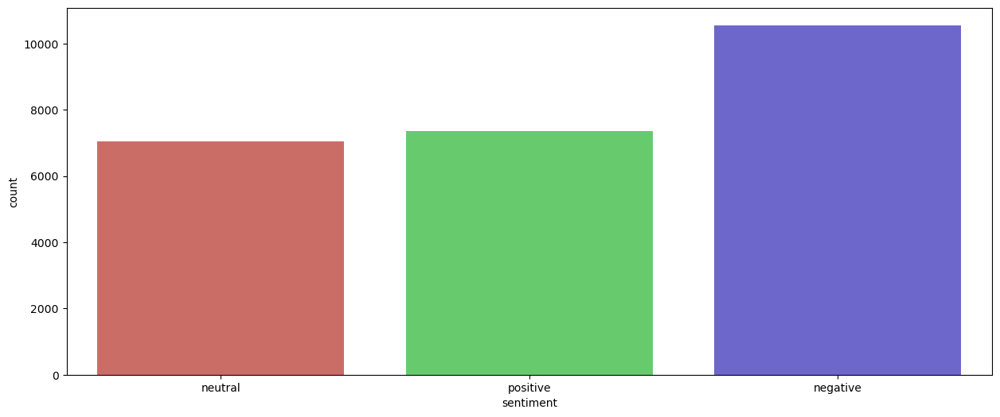

In [27]:
plt.figure(figsize=(15,6))
sns.countplot(x='sentiment', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

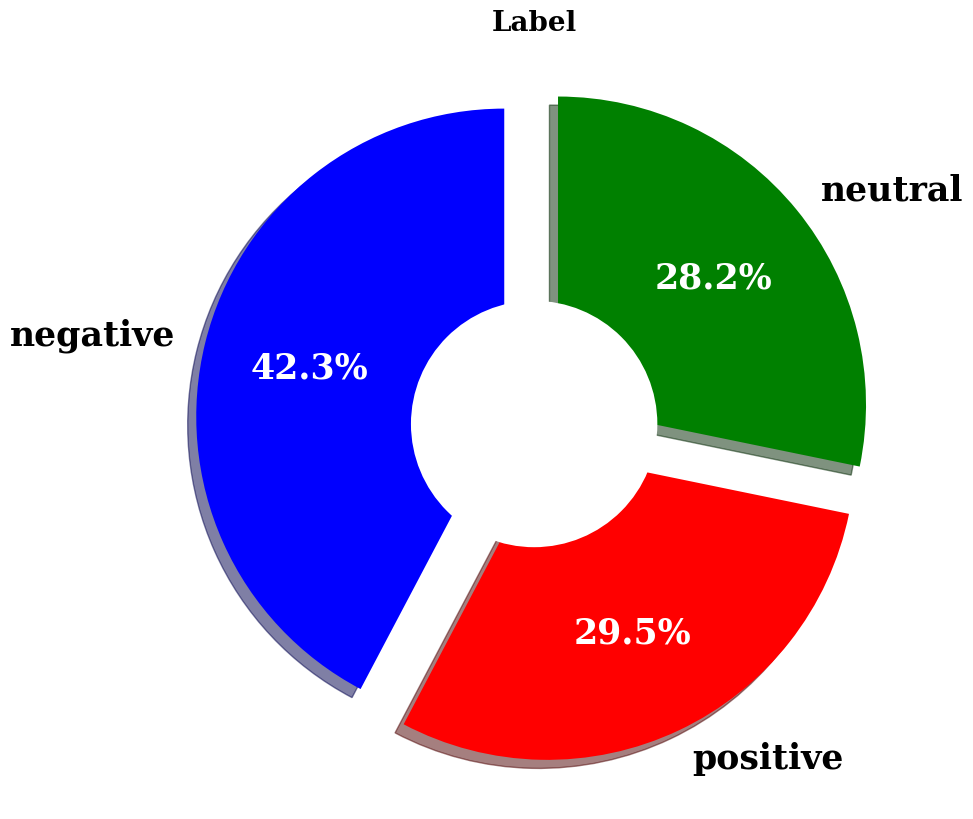

In [28]:
label_data = df['sentiment'].value_counts()

explode = (0.1, 0.1, 0.1)
plt.figure(figsize=(14, 10))
patches, texts, pcts = plt.pie(label_data,
                               labels = label_data.index,
                               colors = ['blue', 'red', 'green'],
                               pctdistance = 0.65,
                               shadow = True,
                               startangle = 90,
                               explode = explode,
                               autopct = '%1.1f%%',
                               textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' })
plt.setp(pcts, color='white')

hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Label', size=20, **hfont)

centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

**Interactive Visualizations using Plotly**

In [29]:
fig = go.Figure(data=[go.Bar(x=df['sentiment'].value_counts().index, y=df['sentiment'].value_counts())])
fig.update_layout(
        title= 'Sentiment',
        xaxis_title="Categories",
        yaxis_title="Count"
    )
fig.show()

Interactive Visualizations using Plotly: PLOTLY creating interactive visualizations that allow users to explore data in a dynamic manner. It provides various interactive features like **zooming, panning, and hover effects,** enabling users to dig deeper into the data and gain valuable insights.For more visit [https://plotly.com/python/](http://)

In [30]:
counts = df['sentiment'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'sentiment')
fig.show()

**Lelts Visualization the emotion column**

In [31]:
df['emotion'].unique()

array(['anticipation', 'joy', 'anger', 'sadness', 'fear', 'optimism',
       'disgust', 'surprise'], dtype=object)

In [32]:
df['emotion'].value_counts()

anger           7520
joy             6325
anticipation    5171
disgust         3000
sadness         1328
optimism        1225
fear             366
surprise          34
Name: emotion, dtype: int64

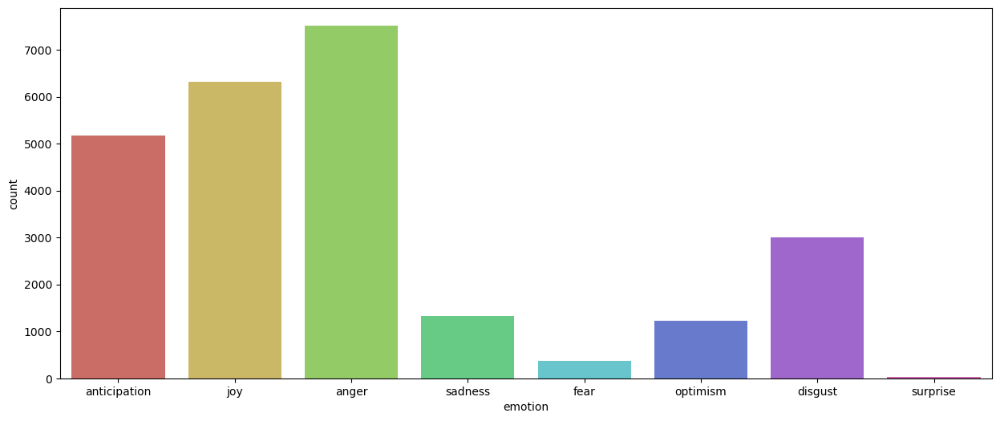

In [33]:
plt.figure(figsize=(15,6))
sns.countplot(x='emotion', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

**From the chart Anger is the max with 30.1% and surprise scored min value with 1%**

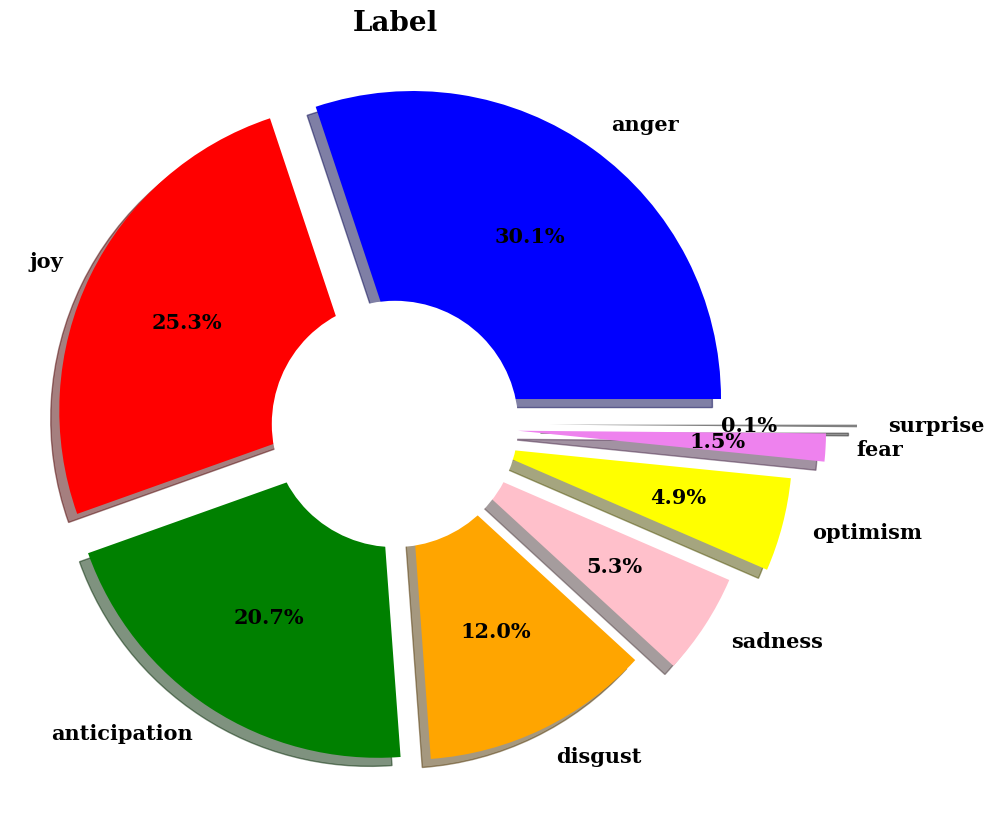

In [34]:
label_data = df['emotion'].value_counts()

explode = (0.1, 0.1, 0.1, 0.1, 0.2, 0.3, 0.4, 0.5)
plt.figure(figsize=(14, 10))
patches, texts, pcts = plt.pie(label_data,
                               labels = label_data.index,
                               colors = ['blue', 'red', 'green', 'orange', 'pink', 'yellow', 'violet', 'grey'],
                               pctdistance = 0.65,
                               shadow = True,
                               startangle = 0,
                               explode = explode,
                               autopct = '%1.1f%%',
                               textprops={ 'fontsize': 15,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' })
plt.setp(pcts, color='black')

hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Label', size=20, **hfont)

centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

In [35]:
fig = go.Figure(data=[go.Bar(x=df['emotion'].value_counts().index, y=df['emotion'].value_counts())])
fig.update_layout(
        title= 'Emotion',
        xaxis_title="Categories",
        yaxis_title="Count"
    )
fig.show()

In [36]:
counts = df['emotion'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Emotion')
fig.show()

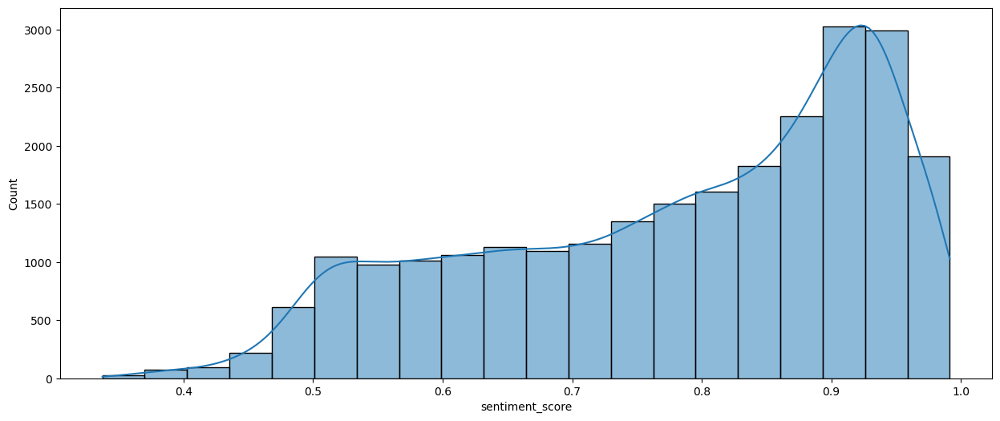

In [37]:
plt.figure(figsize=(15,6))
sns.histplot(df['sentiment_score'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [38]:
fig = go.Figure(data=[go.Histogram(x=df['sentiment_score'], nbinsx=20, marker_color='lightskyblue')])

fig.update_layout(
    title="Sentiment Score Histogram",
    xaxis_title="Sentiment Score",
    yaxis_title="Frequency",
    xaxis=dict(tickangle=0),
    bargap=0.2,
    bargroupgap=0.1,
    autosize=False,
    width=800,
    height=400
)

pio.show(fig)

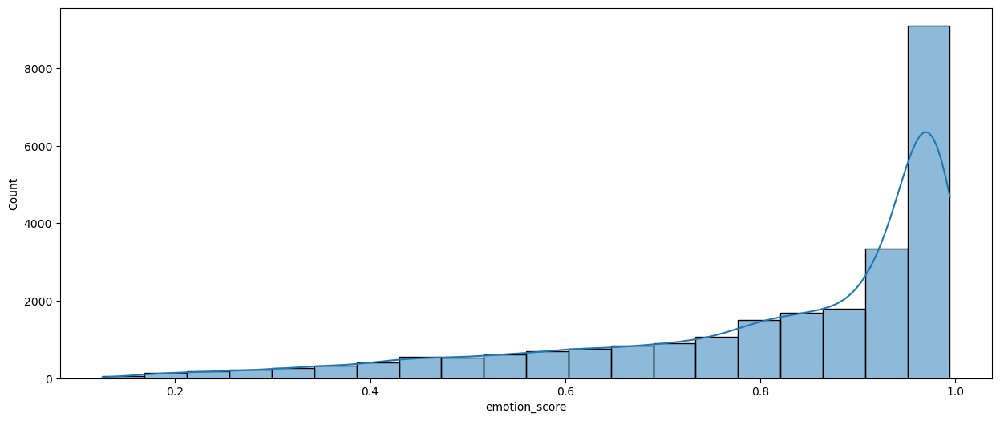

In [39]:
plt.figure(figsize=(15,6))
sns.histplot(df['emotion_score'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [40]:
fig = go.Figure(data=[go.Histogram(x=df['emotion_score'], nbinsx=20, marker_color='lightskyblue')])

fig.update_layout(
    title="Emotion Score Histogram",
    xaxis_title="Emotion Score",
    yaxis_title="Frequency",
    xaxis=dict(tickangle=0),
    bargap=0.2,
    bargroupgap=0.1,
    autosize=False,
    width=800,
    height=400
)

pio.show(fig)

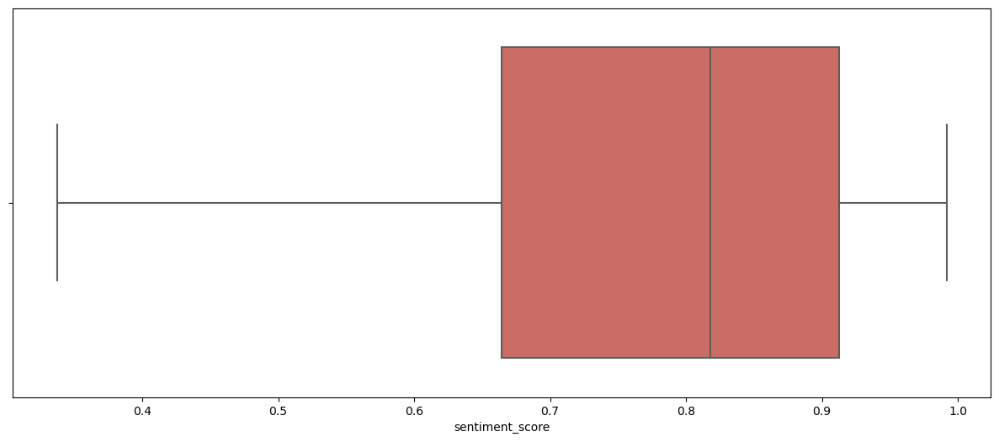

In [41]:
plt.figure(figsize=(15,6))
sns.boxplot(x='sentiment_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [42]:

fig = px.box(df, y='sentiment_score')
fig.update_layout(title='Box Plot of Sentiment Scores')
fig.show()

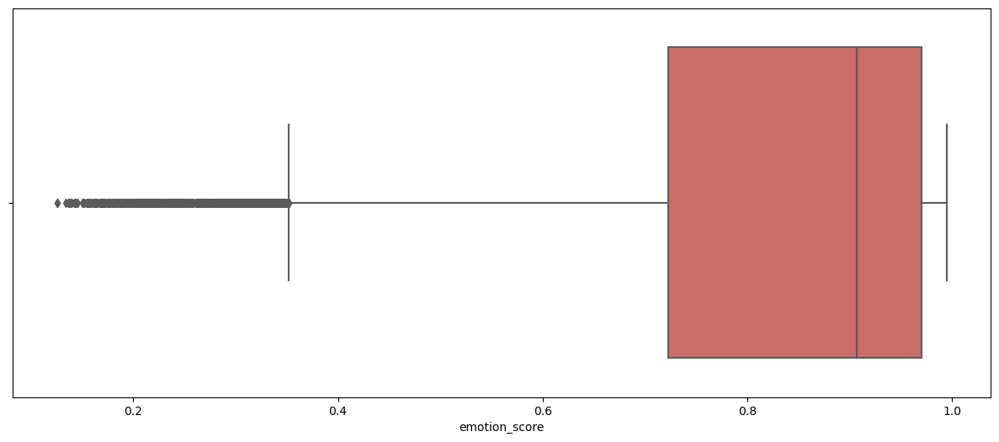

In [43]:
plt.figure(figsize=(15,6))
sns.boxplot(x='emotion_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [44]:
fig = px.box(df, y='emotion_score')
fig.update_layout(title='Box Plot of Emotion Scores')
fig.show()

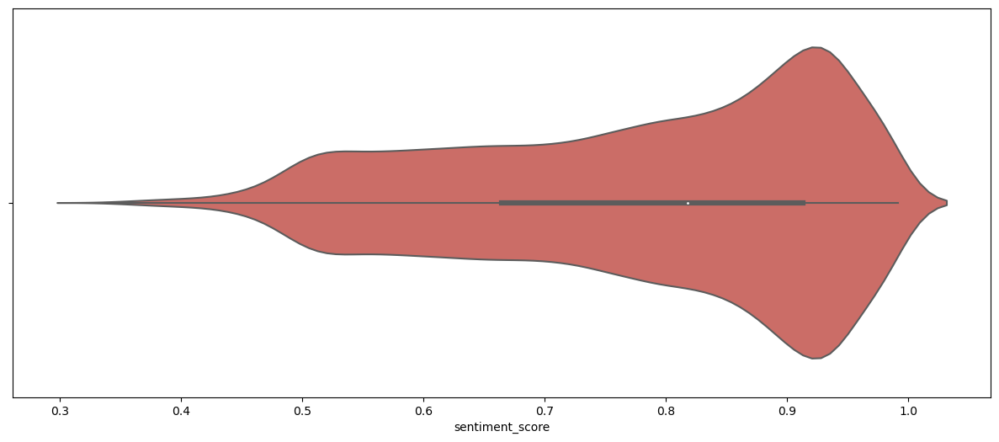

In [45]:
plt.figure(figsize=(15,6))
sns.violinplot(x='sentiment_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [46]:
fig = px.violin(df, y='sentiment_score')
fig.update_layout(title='Violin Plot of Sentiment Scores')
fig.show()

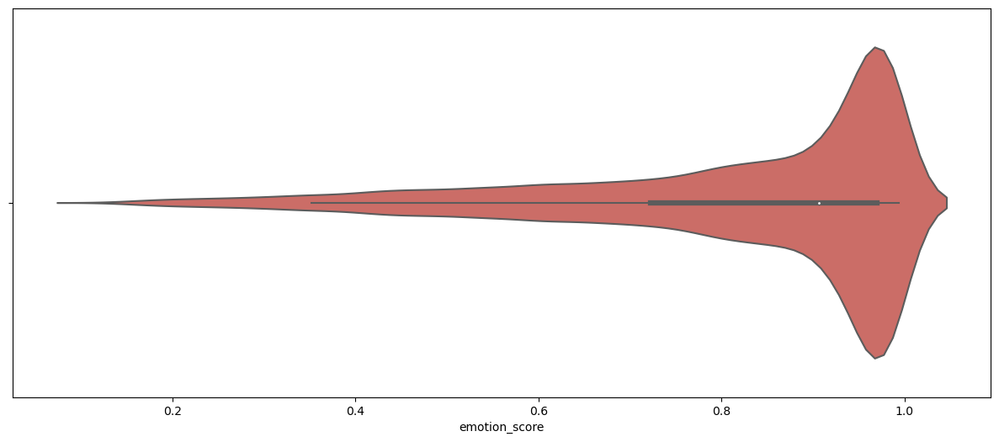

In [47]:
plt.figure(figsize=(15,6))
sns.violinplot(x='emotion_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [48]:
fig = px.violin(df, y='emotion_score')
fig.update_layout(title='Violin Plot of Emotion Scores')
fig.show()

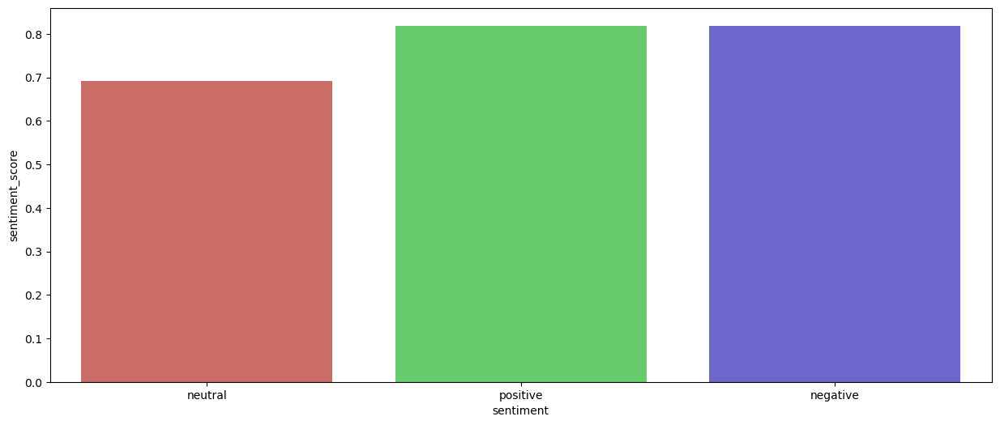

In [49]:
plt.figure(figsize=(15,6))
sns.barplot(x = df['sentiment'], y = df['sentiment_score'], data = df, ci = None, palette = 'hls')
plt.show()

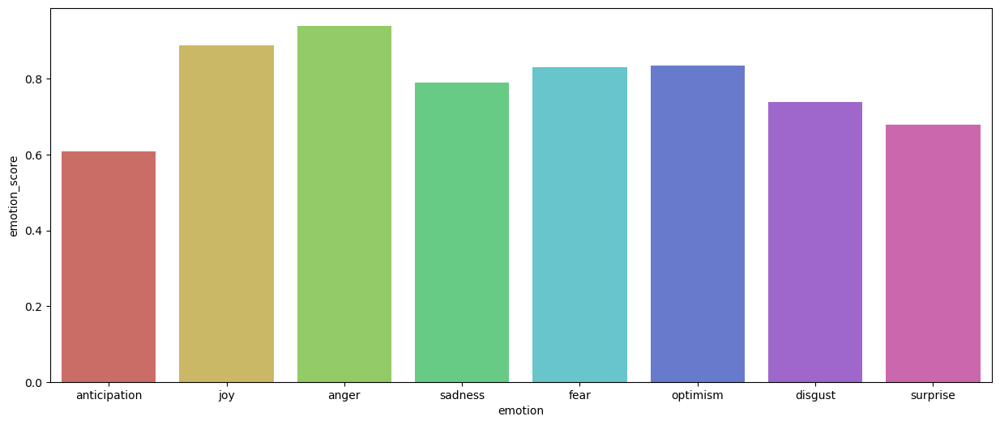

In [50]:
plt.figure(figsize=(15,6))
sns.barplot(x = df['emotion'], y = df['emotion_score'], data = df, ci = None, palette = 'hls')
plt.show()

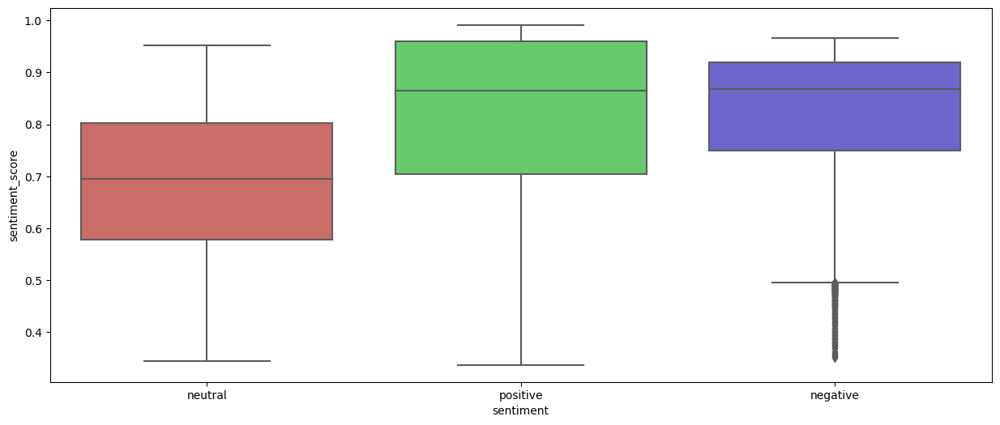

In [51]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['sentiment'], y = df['sentiment_score'], data = df, palette = 'hls')
plt.show()

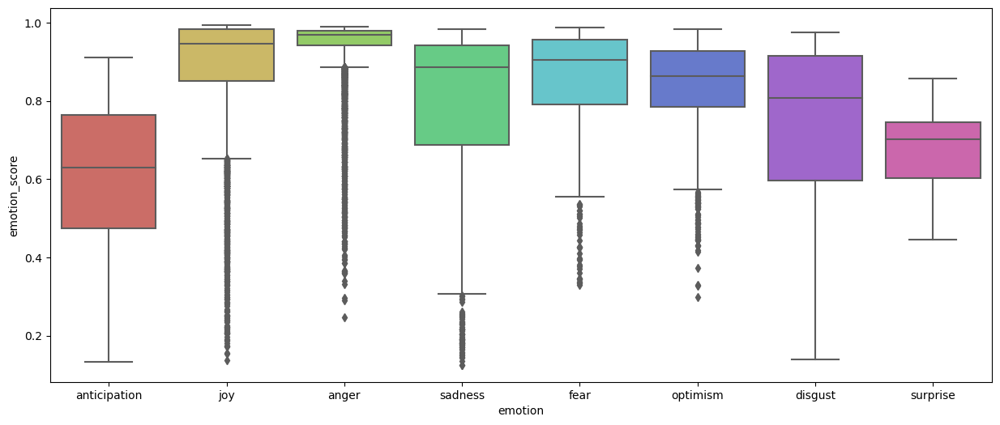

In [52]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['emotion'], y = df['emotion_score'], data = df, palette = 'hls')
plt.show()

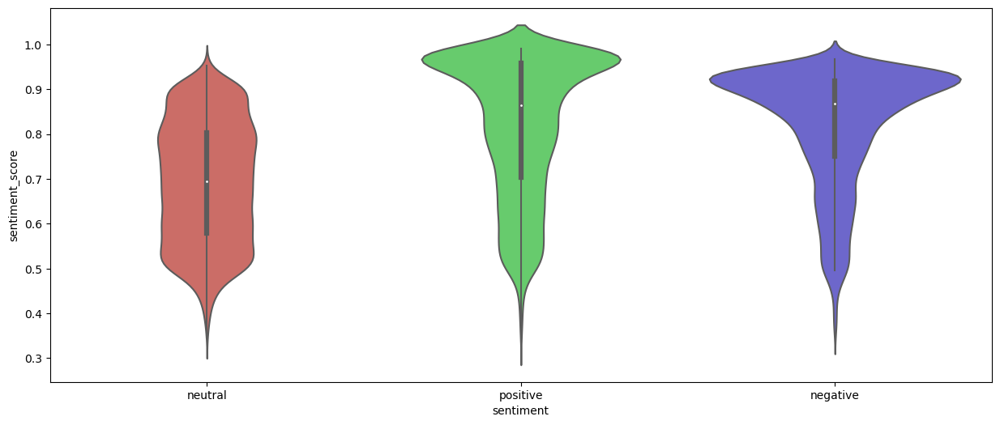

In [53]:
plt.figure(figsize=(15,6))
sns.violinplot(x = df['sentiment'], y = df['sentiment_score'], data = df, palette = 'hls')
plt.show()

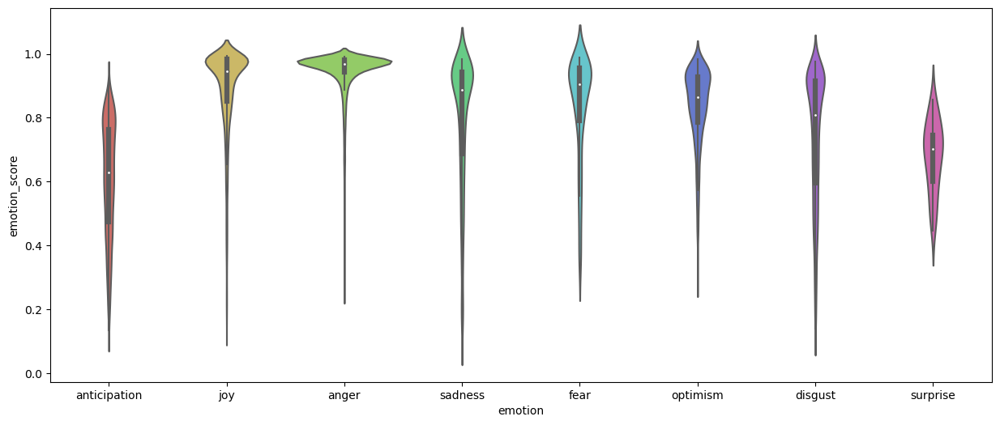

In [54]:
plt.figure(figsize=(15,6))
sns.violinplot(x = df['emotion'], y = df['emotion_score'], data = df, palette = 'hls')
plt.show()

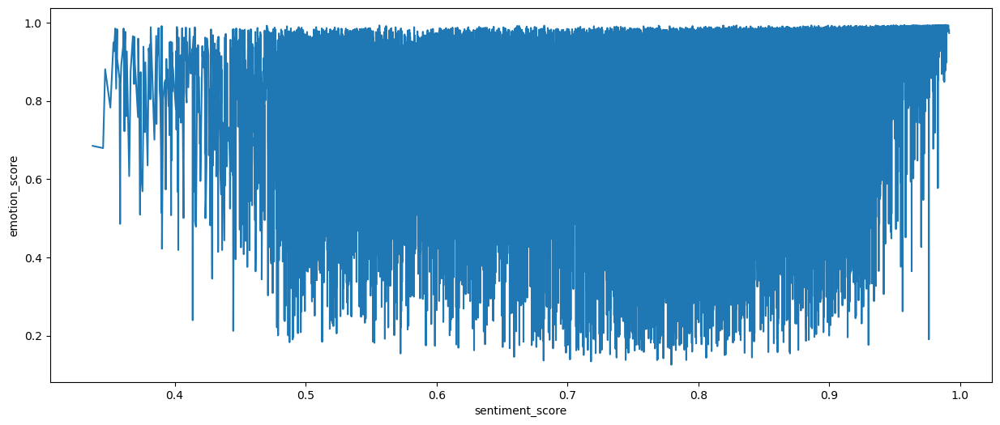

In [55]:
plt.figure(figsize=(15,6))
sns.lineplot(x = df['sentiment_score'], y = df['emotion_score'], data = df, ci = None, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

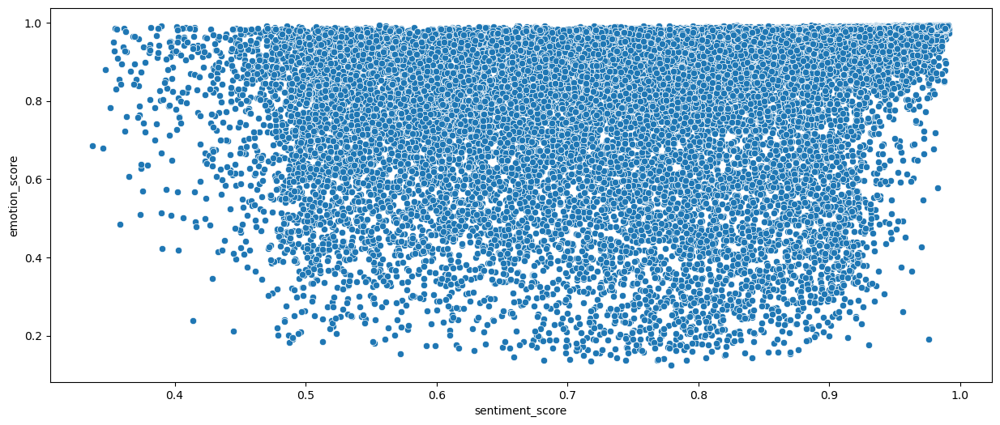

In [56]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = df['sentiment_score'], y = df['emotion_score'], data = df,  palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

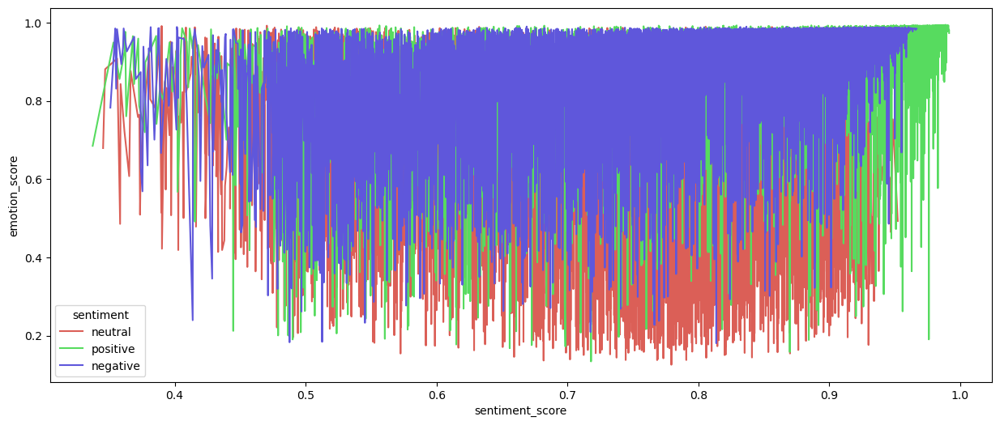

In [57]:
plt.figure(figsize=(15,6))
sns.lineplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['sentiment'], data = df, ci = None, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

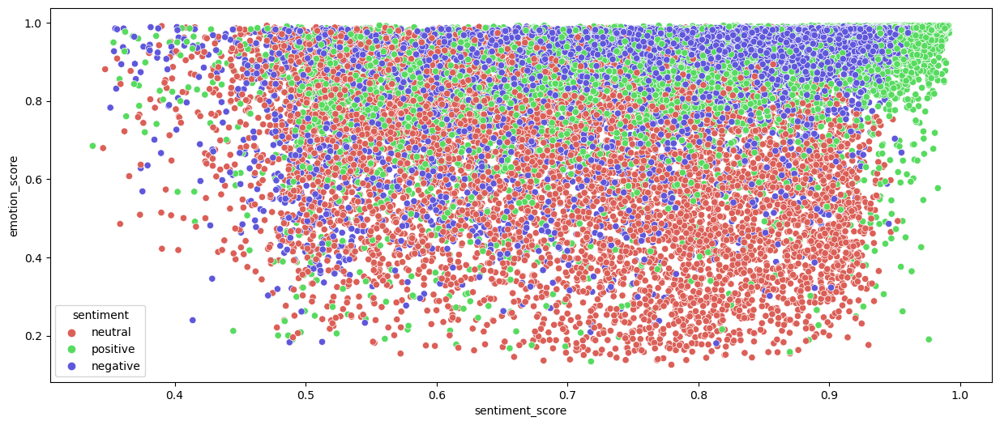

In [58]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['sentiment'], data = df,palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

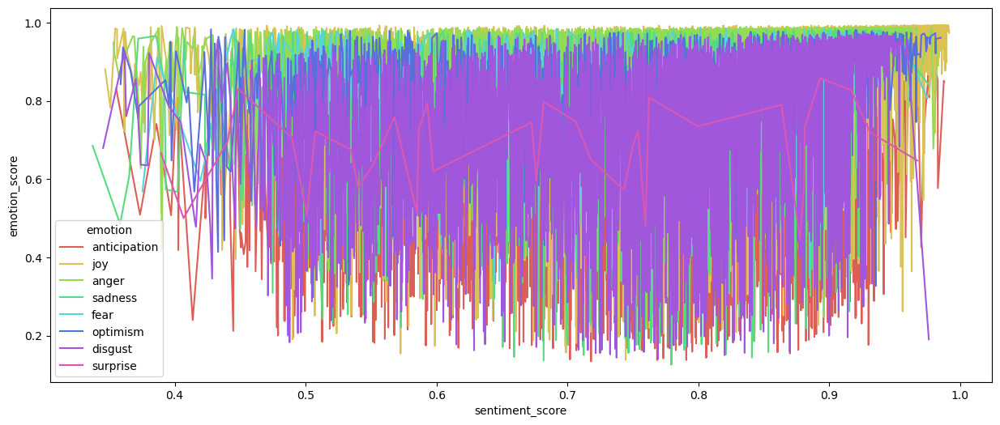

In [59]:
plt.figure(figsize=(15,6))
sns.lineplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['emotion'], data = df, ci = None, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

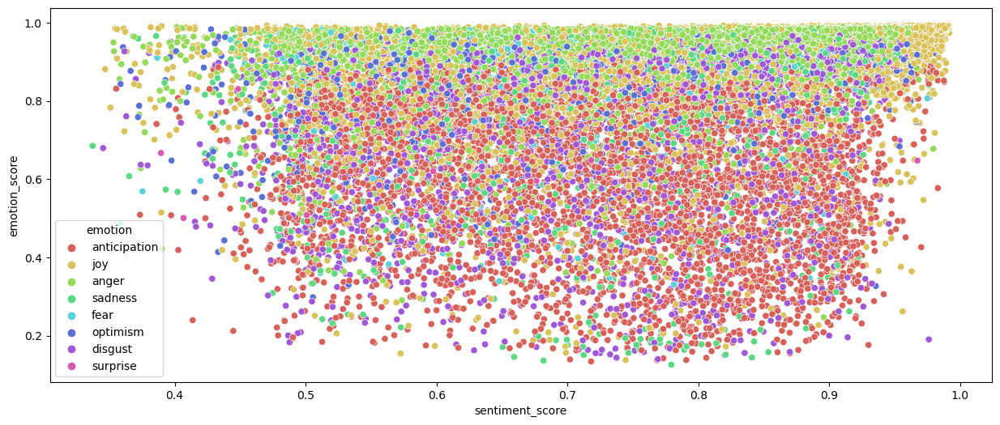

In [60]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['emotion'], data = df,palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

To make Time serious analysis the date-time column must be converted in to date time format ( object to date time format) 

In [61]:
df['Datetime'] = pd.to_datetime(df['Datetime'])

In [62]:
df

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124
...,...,...,...,...,...,...,...
24965,2022-01-01 02:02:04+00:00,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309
24966,2022-01-01 01:57:34+00:00,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701
24967,2022-01-01 01:36:36+00:00,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185
24968,2022-01-01 01:31:30+00:00,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014


In [63]:
df.columns

Index(['Datetime', 'Text', 'Username', 'sentiment', 'sentiment_score',
       'emotion', 'emotion_score'],
      dtype='object')

# 7. Feature Engineering

In [64]:
df['Day'] = df['Datetime'].dt.day
df['Month'] = df['Datetime'].dt.month
df['Year'] = df['Datetime'].dt.year

In [65]:
df

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score,Day,Month,Year
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121,30,9,2022
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913,30,9,2022
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347,30,9,2022
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203,30,9,2022
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124,30,9,2022
...,...,...,...,...,...,...,...,...,...,...
24965,2022-01-01 02:02:04+00:00,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309,1,1,2022
24966,2022-01-01 01:57:34+00:00,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701,1,1,2022
24967,2022-01-01 01:36:36+00:00,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185,1,1,2022
24968,2022-01-01 01:31:30+00:00,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014,1,1,2022


Day, Month and Year added as a new column so we can do the following analysis

1. Daily Sentiment Analysis
1. Daily Emotion Analysis

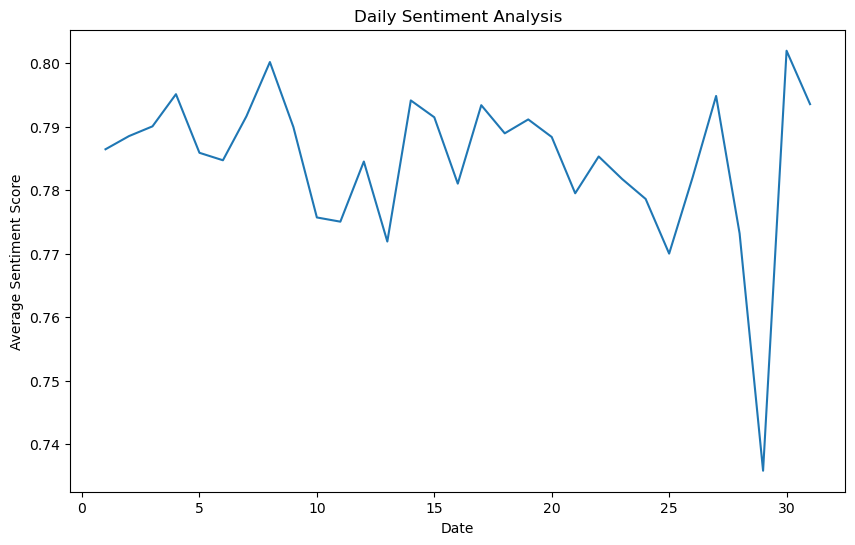

In [66]:
# Group by day and calculate average sentiment score
daily_sentiment = df.groupby(df['Day'])['sentiment_score'].mean()

# Visualize daily sentiment scores
plt.figure(figsize=(10, 6))
plt.plot(daily_sentiment.index, daily_sentiment.values)
plt.xlabel('Date')
plt.ylabel('Average Sentiment Score')
plt.title('Daily Sentiment Analysis')
plt.show()

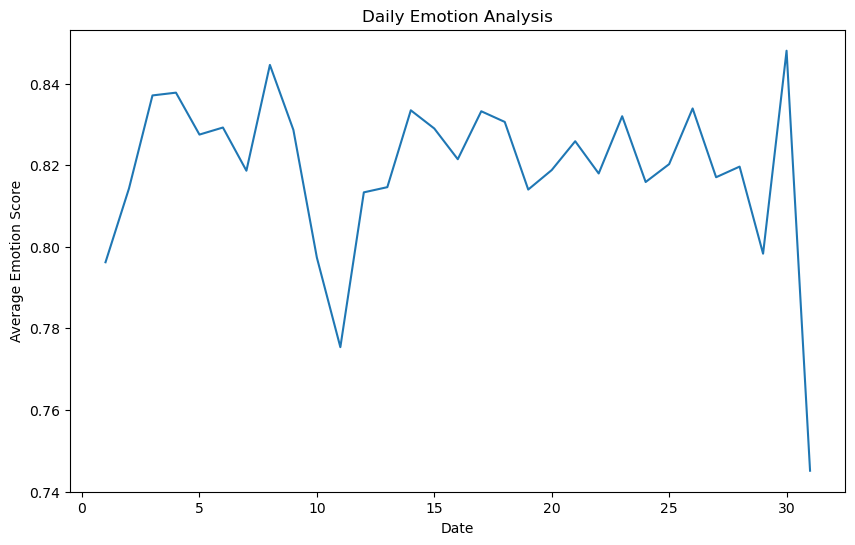

In [67]:
daily_emotion = df.groupby(df['Day'])['emotion_score'].mean()
plt.figure(figsize=(10, 6))
plt.plot(daily_emotion.index, daily_emotion.values)
plt.xlabel('Date')
plt.ylabel('Average Emotion Score')
plt.title('Daily Emotion Analysis')
plt.show()

In [68]:
# Group by day and calculate average sentiment score
daily_sentiment = df.groupby(df['Day'])['sentiment_score'].mean().reset_index()

# Visualize daily sentiment scores
fig = px.line(daily_sentiment, x='Day', y='sentiment_score', title='Daily Sentiment Analysis')
fig.update_layout(xaxis_title='Date', yaxis_title='Average Sentiment Score')
fig.show()

In [69]:
daily_sentiment

,Day,sentiment_score
0,1,0.786436
1,2,0.788508
2,3,0.790041
3,4,0.795103
4,5,0.785880
5,6,0.784704
6,7,0.791620
7,8,0.800161
8,9,0.789938
9,10,0.775706


In [70]:
# Group by day and calculate average emotion score
daily_emotion = df.groupby(df['Day'])['emotion_score'].mean().reset_index()

# Visualize daily emotion scores
fig = px.line(daily_emotion, x='Day', y='emotion_score', title='Daily Emotion Analysis')
fig.update_layout(xaxis_title='Date', yaxis_title='Average Emotion Score')
fig.show()

In [71]:
df1=df.copy()

**Calculate daily average sentiment score**

In [72]:
# Prepare the data
df1.set_index('Datetime', inplace=True)

# Calculate daily average sentiment score
daily_sentiment = df1['sentiment_score'].resample('D').mean()

# Plot daily sentiment analysis
fig = px.line(daily_sentiment, x=daily_sentiment.index, y=daily_sentiment.values)
fig.update_layout(
    title="Daily Sentiment Analysis",
    xaxis_title="Date",
    yaxis_title="Average Sentiment Score"
)
fig.show()

# Calculate daily average emotion score
daily_emotion = df1['emotion_score'].resample('D').mean()

# Plot daily emotion analysis
fig = px.line(daily_emotion, x=daily_emotion.index, y=daily_emotion.values)
fig.update_layout(
    title="Daily Emotion Analysis",
    xaxis_title="Date",
    yaxis_title="Average Emotion Score"
)
fig.show()

In [73]:
df2=df.copy()

**daily sentiment scores for each category**

In [74]:
# Prepare the data
df2.set_index('Datetime', inplace=True)

# Resample the data to get daily sentiment scores for each category
daily_sentiments = df2.groupby(['Day', 'sentiment'])['sentiment_score'].mean().unstack()

# Plot the comparative analysis
fig = go.Figure()

# Add traces for each sentiment category
for sentiment in ['positive', 'negative', 'neutral']:
    fig.add_trace(go.Scatter(
        x=daily_sentiments.index,
        y=daily_sentiments[sentiment],
        mode='lines',
        name=sentiment.capitalize()
    ))

fig.update_layout(
    title="Comparative Sentiment Analysis",
    xaxis_title="Date",
    yaxis_title="Average Sentiment Score",
    legend_title="Sentiment"
)
fig.show()

In [75]:
df3=df.copy()

**daily emotion scores for each category**

In [76]:
# Prepare the data
df3.set_index('Datetime', inplace=True)

# Resample the data to get daily emotion scores for each category
daily_emotions = df3.groupby(['Day', 'emotion'])['emotion_score'].mean().unstack()

# Plot the comparative analysis
fig = go.Figure()

# Add traces for each emotion category
for emotion in ['anticipation', 'joy', 'anger', 'sadness', 'fear', 'optimism',
       'disgust', 'surprise']:
    fig.add_trace(go.Scatter(
        x=daily_emotions.index,
        y=daily_emotions[emotion],
        mode='lines',
        name=emotion.capitalize()
    ))

fig.update_layout(
    title="Comparative Emotion Analysis",
    xaxis_title="Date",
    yaxis_title="Average Emotion Score",
    legend_title="Emotion"
)
fig.show()

In [77]:
df

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score,Day,Month,Year
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121,30,9,2022
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913,30,9,2022
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347,30,9,2022
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203,30,9,2022
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124,30,9,2022
...,...,...,...,...,...,...,...,...,...,...
24965,2022-01-01 02:02:04+00:00,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309,1,1,2022
24966,2022-01-01 01:57:34+00:00,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701,1,1,2022
24967,2022-01-01 01:36:36+00:00,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185,1,1,2022
24968,2022-01-01 01:31:30+00:00,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014,1,1,2022


In [78]:
df4=df.copy()

In [79]:
df4.columns

Index(['Datetime', 'Text', 'Username', 'sentiment', 'sentiment_score',
       'emotion', 'emotion_score', 'Day', 'Month', 'Year'],
      dtype='object')

In [80]:
df4 = df[['Text', 'sentiment', 'sentiment_score',
       'emotion', 'emotion_score']]

In [81]:
df4

,Text,sentiment,sentiment_score,emotion,emotion_score
0,@Logitech @apple @Google @Microsoft @Dell @Len...,neutral,0.853283,anticipation,0.587121
1,@MK_habit_addict @official_stier @MortalKombat...,neutral,0.519470,joy,0.886913
2,"As @CRN celebrates its 40th anniversary, Bob F...",positive,0.763791,joy,0.960347
3,@dell your customer service is horrible especi...,negative,0.954023,anger,0.983203
4,@zacokalo @Dell @DellCares @Dell give the man ...,neutral,0.529170,anger,0.776124
...,...,...,...,...,...
24965,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,negative,0.682981,anger,0.906309
24966,@kite_real @GamersNexus @Dell I didn't really ...,positive,0.743940,joy,0.951701
24967,Hey @JoshTheFixer here it is....27 4K UHD USB-...,neutral,0.654463,anticipation,0.471185
24968,@bravadogaming @thewolfpena @Alienware @intel ...,neutral,0.794049,anticipation,0.747014


# 8. Data Preprocessing and Data Cleaning

In [82]:
def clean_text(text):
    text = text.lower() 
    return text.strip()



1. `text = text.lower()`: This line converts the text to lowercase. It is used to ensure consistent case when working with the text data.

2. `return text.strip()`: This line removes any leading or trailing whitespace from the text. It is used to eliminate unnecessary spaces that might be present.



In [83]:
df4.Text = df4.Text.apply(lambda x: clean_text(x))

In [84]:
df4['Text']

0        @logitech @apple @google @microsoft @dell @len...
1        @mk_habit_addict @official_stier @mortalkombat...
2        as @crn celebrates its 40th anniversary, bob f...
3        @dell your customer service is horrible especi...
4        @zacokalo @dell @dellcares @dell give the man ...
                               ...                        
24965    @eldarkangel2 @gamersnexus @dell i wouldn't ev...
24966    @kite_real @gamersnexus @dell i didn't really ...
24967    hey @joshthefixer here it is....27 4k uhd usb-...
24968    @bravadogaming @thewolfpena @alienware @intel ...
24969    @rabia_ejaz @dell stopped buying windows lapto...
Name: Text, Length: 24969, dtype: object

In [85]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [86]:
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

1. The`string` module, which contains a string constant `punctuation` that represents all the punctuation characters.

2. The function `remove_punctuation` that takes a text as input. Within the function, it uses a list comprehension to iterate over each character in the text and checks if it is not present in the `string.punctuation` string. This filters out all the punctuation characters from the text.

3. The `remove_punctuation` function helps in removing punctuation characters from a given text.

In [87]:
df4.Text= df4['Text'].apply(lambda x:remove_punctuation(x))

In [88]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialstier mortalkombat newze...
2        as crn celebrates its 40th anniversary bob fal...
3        dell your customer service is horrible especia...
4        zacokalo dell dellcares dell give the man what...
                               ...                        
24965    eldarkangel2 gamersnexus dell i wouldnt even k...
24966    kitereal gamersnexus dell i didnt really leave...
24967    hey joshthefixer here it is27 4k uhd usbc by d...
24968    bravadogaming thewolfpena alienware intel inte...
24969    rabiaejaz dell stopped buying windows laptops ...
Name: Text, Length: 24969, dtype: object

In [89]:
import re
def tokenization(text):
    tokens = re.split('W+',text)
    return tokens


1. It imports the `re` module, which provides support for regular expressions in Python.

2. The `tokenization` function takes a text as input. Within the function, it uses the `re.split()` function to split the text into tokens based on the specified pattern `'W+'`. This pattern matches one or more non-word characters. The resulting tokens are stored in a list.

3. The `apply()` method is used to apply the `tokenization` function to each element in the 'Text' column of `df4`. The result is then assigned back to the 'Text' column of `df4`.



In [90]:
df4['Text']= df4['Text'].apply(lambda x: tokenization(x))

In [91]:
df4['Text']

0        [logitech apple google microsoft dell lenovo w...
1        [mkhabitaddict officialstier mortalkombat newz...
2        [as crn celebrates its 40th anniversary bob fa...
3        [dell your customer service is horrible especi...
4        [zacokalo dell dellcares dell give the man wha...
                               ...                        
24965    [eldarkangel2 gamersnexus dell i wouldnt even ...
24966    [kitereal gamersnexus dell i didnt really leav...
24967    [hey joshthefixer here it is27 4k uhd usbc by ...
24968    [bravadogaming thewolfpena alienware intel int...
24969    [rabiaejaz dell stopped buying windows laptops...
Name: Text, Length: 24969, dtype: object

In [92]:
import nltk
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Here's what the code does:

1. It imports the `nltk` library, which is a popular library for natural language processing tasks in Python.

2. The `nltk.download('stopwords')` command downloads the stopwords corpus from NLTK. Stopwords are common words in a language (e.g., "the", "is", "in") that are often removed from text during preprocessing as they do not carry significant meaning.

3. The `nltk.corpus.stopwords.words('english')` command retrieves a list of English stopwords from the NLTK stopwords corpus. These stopwords are commonly used in English text and can be used to filter out irrelevant words during text processing.


In [93]:
stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [94]:
def remove_stopwords(text):
    output= " ".join(i for i in text if i not in stopwords)
    return output

Here's what the code does:

1. It iterates over each word in the input text using a list comprehension.
2. For each word, it checks if the word is not in the `stopwords` list.
3. If the word is not a stopword, it includes it in the output.
4. Finally, it joins the non-stopwords back into a single string using a space as the separator.



In [95]:
df4['Text']= df4['Text'].apply(lambda x:remove_stopwords(x))

In [96]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialstier mortalkombat newze...
2        as crn celebrates its 40th anniversary bob fal...
3        dell your customer service is horrible especia...
4        zacokalo dell dellcares dell give the man what...
                               ...                        
24965    eldarkangel2 gamersnexus dell i wouldnt even k...
24966    kitereal gamersnexus dell i didnt really leave...
24967    hey joshthefixer here it is27 4k uhd usbc by d...
24968    bravadogaming thewolfpena alienware intel inte...
24969    rabiaejaz dell stopped buying windows laptops ...
Name: Text, Length: 24969, dtype: object

In [97]:
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

In [98]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [99]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...


True

In [100]:
def lemmatizer(text):
    lemm_text = "".join([wordnet_lemmatizer.lemmatize(word) for word in text])
    return lemm_text

In [101]:
#df4['Text']=df4['Text'].apply(lambda x:lemmatizer(x))

In [102]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialstier mortalkombat newze...
2        as crn celebrates its 40th anniversary bob fal...
3        dell your customer service is horrible especia...
4        zacokalo dell dellcares dell give the man what...
                               ...                        
24965    eldarkangel2 gamersnexus dell i wouldnt even k...
24966    kitereal gamersnexus dell i didnt really leave...
24967    hey joshthefixer here it is27 4k uhd usbc by d...
24968    bravadogaming thewolfpena alienware intel inte...
24969    rabiaejaz dell stopped buying windows laptops ...
Name: Text, Length: 24969, dtype: object

In [103]:
def clean_text(text):
    text = re.sub('\[.*\]','', text).strip() 
    text = re.sub('\S*\d\S*\s*','', text).strip()  
    return text.strip()

In [104]:
df4['Text'] = df4.Text.apply(lambda x: clean_text(x))

In [105]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialstier mortalkombat newze...
2        as crn celebrates its anniversary bob faletra ...
3        dell your customer service is horrible especia...
4        zacokalo dell dellcares dell give the man what...
                               ...                        
24965    gamersnexus dell i wouldnt even know what to b...
24966    kitereal gamersnexus dell i didnt really leave...
24967    hey joshthefixer here it uhd usbc by dell http...
24968    bravadogaming thewolfpena alienware intel inte...
24969    rabiaejaz dell stopped buying windows laptops ...
Name: Text, Length: 24969, dtype: object

In [106]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [107]:
stopwords = nlp.Defaults.stop_words
def lemmatizer(text):
    doc = nlp(text)
    sent = [token.lemma_ for token in doc if not token.text in set(stopwords)]
    return ' '.join(sent)

In [108]:
df4['Text'] =  df4.Text.apply(lambda x: lemmatizer(x))

In [109]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialsti mortalkombat newzeal...
2          crn   celebrate anniversary   bob faletra   ...
3        dell customer service horrible especially agen...
4                     zacokalo dell dellcares dell man pay
                               ...                        
24965    gamersnexus dell not know blow whistle people ...
24966    kitereal gamersnexus dell not leave ethical re...
24967    hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa
24968    bravadogame thewolfpena alienware intel intela...
24969    rabiaejaz dell stop buy window laptop longtime...
Name: Text, Length: 24969, dtype: object

In [110]:
def remove_urls(vTEXT):
    vTEXT = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', vTEXT, flags=re.MULTILINE)
    return(vTEXT)

In [111]:
df4['Text'] = df4.Text.apply(lambda x: remove_urls(x))

In [112]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialsti mortalkombat newzeal...
2          crn   celebrate anniversary   bob faletra   ...
3        dell customer service horrible especially agen...
4                     zacokalo dell dellcares dell man pay
                               ...                        
24965    gamersnexus dell not know blow whistle people ...
24966    kitereal gamersnexus dell not leave ethical re...
24967    hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa
24968    bravadogame thewolfpena alienware intel intela...
24969    rabiaejaz dell stop buy window laptop longtime...
Name: Text, Length: 24969, dtype: object

In [113]:
def remove_digits(text):
    clean_text = re.sub(r"\b[0-9]+\b\s*", "", text)
    return(text)

In [114]:
df4['Text'] = df4.Text.apply(lambda x: remove_digits(x))

In [115]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialsti mortalkombat newzeal...
2          crn   celebrate anniversary   bob faletra   ...
3        dell customer service horrible especially agen...
4                     zacokalo dell dellcares dell man pay
                               ...                        
24965    gamersnexus dell not know blow whistle people ...
24966    kitereal gamersnexus dell not leave ethical re...
24967    hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa
24968    bravadogame thewolfpena alienware intel intela...
24969    rabiaejaz dell stop buy window laptop longtime...
Name: Text, Length: 24969, dtype: object

In [116]:
def remove_digits1(sample_text):
    clean_text = " ".join([w for w in sample_text.split() if not w.isdigit()]) 
    return(clean_text)

In [117]:
df4['Text'] = df4.Text.apply(lambda x: remove_digits1(x))

In [118]:
df4['Text']

0        logitech apple google microsoft dell lenovo wh...
1        mkhabitaddict officialsti mortalkombat newzeal...
2        crn celebrate anniversary bob faletra stevenjb...
3        dell customer service horrible especially agen...
4                     zacokalo dell dellcares dell man pay
                               ...                        
24965    gamersnexus dell not know blow whistle people ...
24966    kitereal gamersnexus dell not leave ethical re...
24967    hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa
24968    bravadogame thewolfpena alienware intel intela...
24969    rabiaejaz dell stop buy window laptop longtime...
Name: Text, Length: 24969, dtype: object

In [119]:
def remove_emojis(data):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               "]+", flags=re.UNICODE)
    return re.sub(emoji_pattern, '', data)

In [120]:
df4['Text'] = df4.Text.apply(lambda x: remove_emojis(x))

In [121]:
df4

,Text,sentiment,sentiment_score,emotion,emotion_score
0,logitech apple google microsoft dell lenovo wh...,neutral,0.853283,anticipation,0.587121
1,mkhabitaddict officialsti mortalkombat newzeal...,neutral,0.519470,joy,0.886913
2,crn celebrate anniversary bob faletra stevenjb...,positive,0.763791,joy,0.960347
3,dell customer service horrible especially agen...,negative,0.954023,anger,0.983203
4,zacokalo dell dellcares dell man pay,neutral,0.529170,anger,0.776124
...,...,...,...,...,...
24965,gamersnexus dell not know blow whistle people ...,negative,0.682981,anger,0.906309
24966,kitereal gamersnexus dell not leave ethical re...,positive,0.743940,joy,0.951701
24967,hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa,neutral,0.654463,anticipation,0.471185
24968,bravadogame thewolfpena alienware intel intela...,neutral,0.794049,anticipation,0.747014


In [122]:
df4['Text_Length'] = df4['Text'].apply(lambda x: len(x))

In [123]:
df4

,Text,sentiment,sentiment_score,emotion,emotion_score,Text_Length
0,logitech apple google microsoft dell lenovo wh...,neutral,0.853283,anticipation,0.587121,211
1,mkhabitaddict officialsti mortalkombat newzeal...,neutral,0.519470,joy,0.886913,106
2,crn celebrate anniversary bob faletra stevenjb...,positive,0.763791,joy,0.960347,171
3,dell customer service horrible especially agen...,negative,0.954023,anger,0.983203,143
4,zacokalo dell dellcares dell man pay,neutral,0.529170,anger,0.776124,36
...,...,...,...,...,...,...
24965,gamersnexus dell not know blow whistle people ...,negative,0.682981,anger,0.906309,155
24966,kitereal gamersnexus dell not leave ethical re...,positive,0.743940,joy,0.951701,84
24967,hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa,neutral,0.654463,anticipation,0.471185,49
24968,bravadogame thewolfpena alienware intel intela...,neutral,0.794049,anticipation,0.747014,151


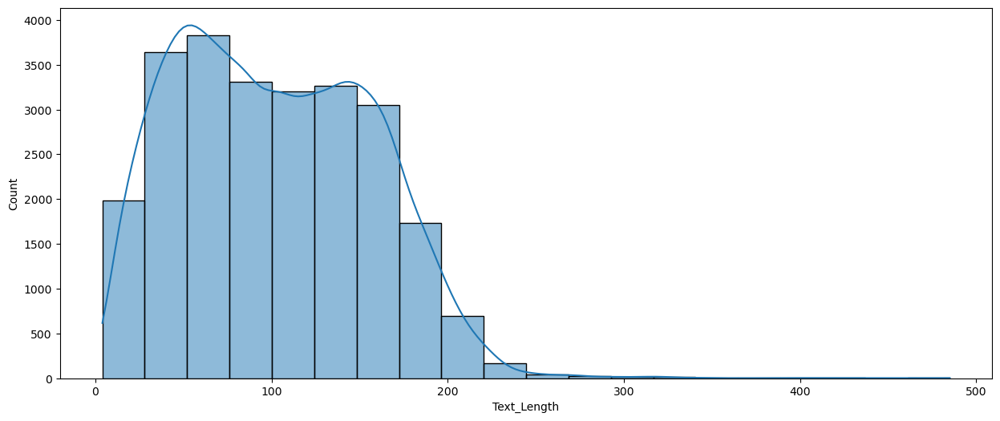

In [124]:
plt.figure(figsize=(15,6))
sns.histplot(df4['Text_Length'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

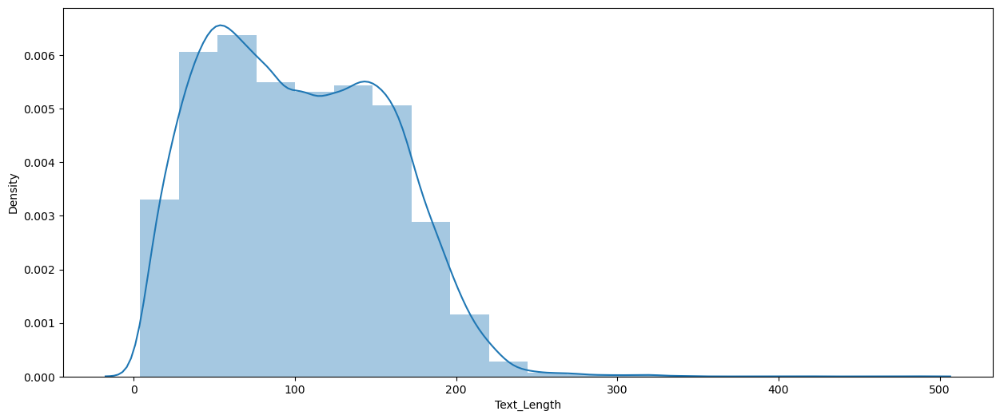

In [125]:
plt.figure(figsize=(15,6))
sns.distplot(df4['Text_Length'], kde = True, bins = 20)
plt.xticks(rotation = 0)
plt.show()

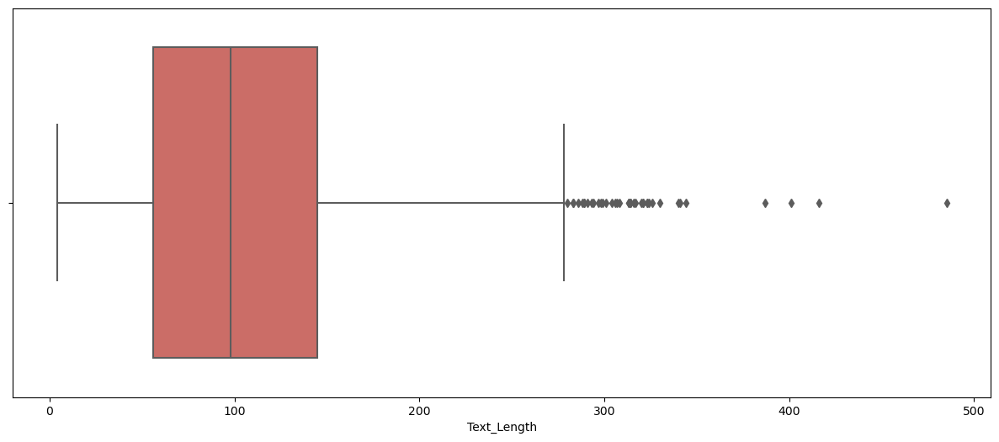

In [126]:
plt.figure(figsize=(15,6))
sns.boxplot(x='Text_Length', data = df4, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

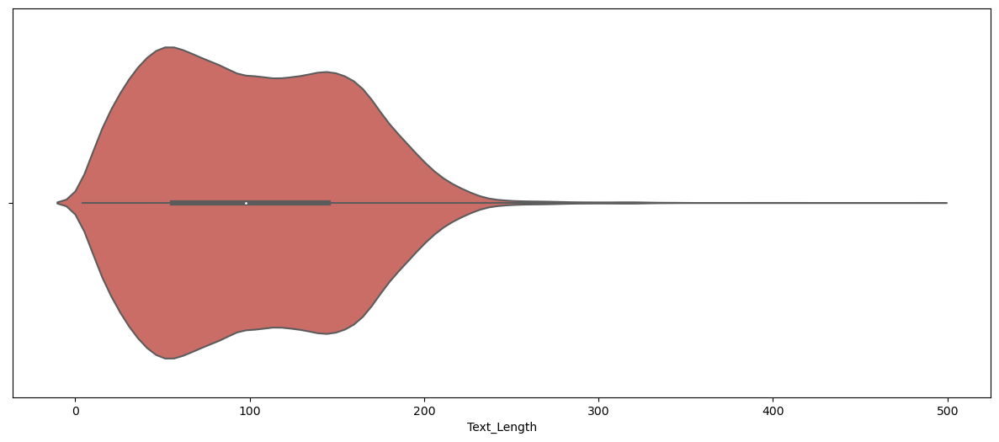

In [127]:
plt.figure(figsize=(15,6))
sns.violinplot(x='Text_Length', data = df4, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [128]:
import wordcloud

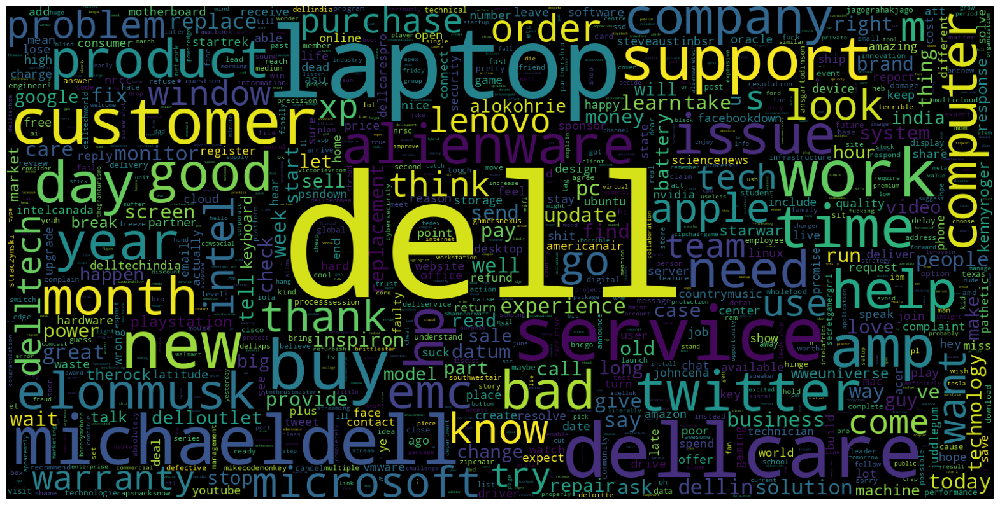

In [129]:
from wordcloud import WordCloud
data = df4['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

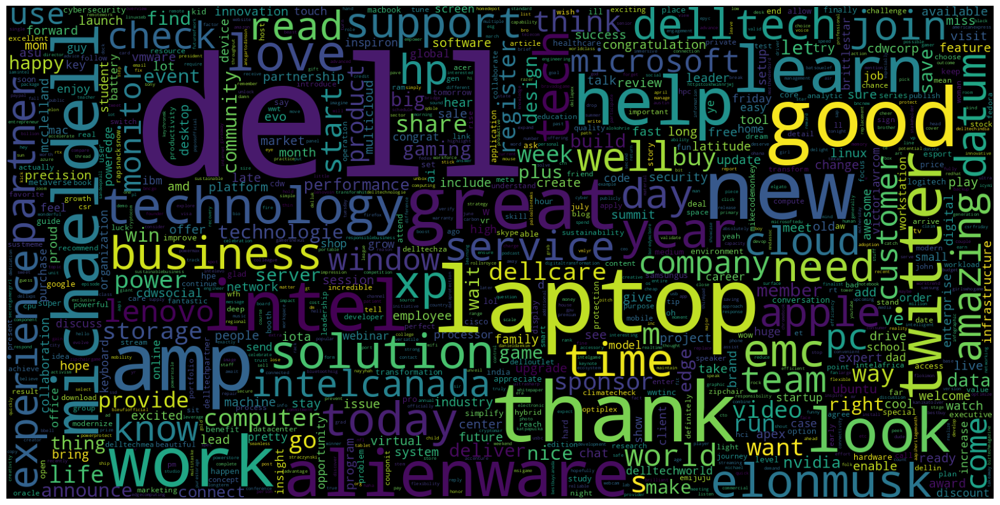

In [130]:
data = df4[df4['sentiment']=="positive"]['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

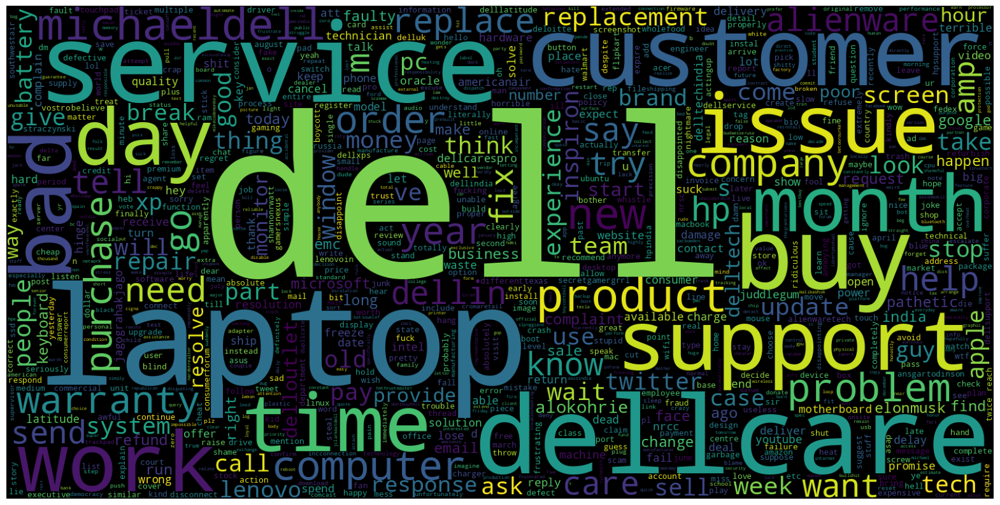

In [131]:
data = df4[df4['sentiment']=="negative"]['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

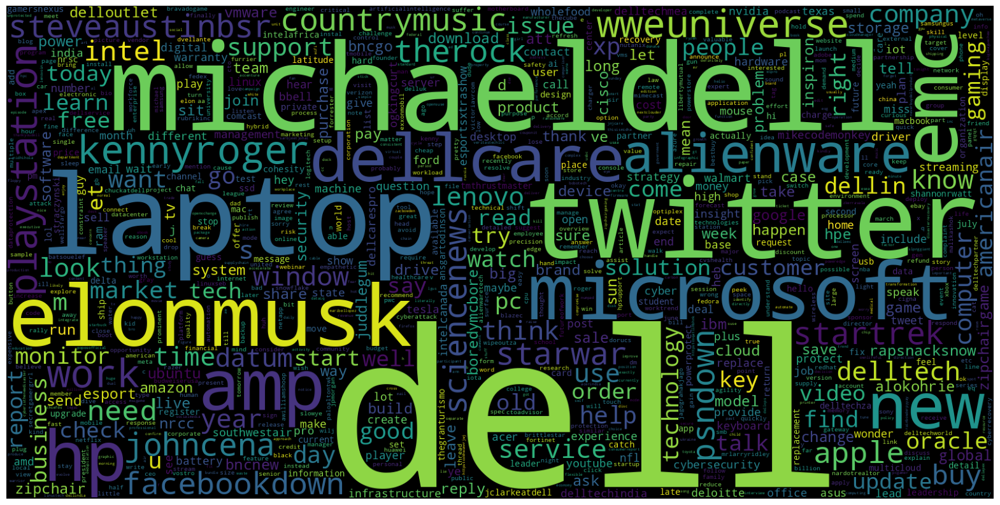

In [132]:
data = df4[df4['sentiment']=="neutral"]['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

In [133]:
df5 = df4[['Text','sentiment']]

In [134]:
df5

,Text,sentiment
0,logitech apple google microsoft dell lenovo wh...,neutral
1,mkhabitaddict officialsti mortalkombat newzeal...,neutral
2,crn celebrate anniversary bob faletra stevenjb...,positive
3,dell customer service horrible especially agen...,negative
4,zacokalo dell dellcares dell man pay,neutral
...,...,...
24965,gamersnexus dell not know blow whistle people ...,negative
24966,kitereal gamersnexus dell not leave ethical re...,positive
24967,hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa,neutral
24968,bravadogame thewolfpena alienware intel intela...,neutral


# 9. Model development Machine Learning model

**Model 1: MultinomialNB**

In [135]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report


- `TfidfVectorizer`: This module is used for text feature extraction and transformation. It converts a collection of raw documents into a matrix of TF-IDF (Term Frequency-Inverse Document Frequency) features, which can be used as input for machine learning models.

- `train_test_split`: This module is used to split a dataset into training and testing subsets. It randomly divides the data into two parts, typically with a specified ratio, allowing you to evaluate the performance of a model on unseen data.

- `MultinomialNB`: This module implements the Naive Bayes algorithm for multinomially distributed data. It is commonly used for text classification tasks.

- `accuracy_score`: This module provides a function to calculate the accuracy of a classification model by comparing the predicted labels with the true labels.

- `classification_report`: This module generates a classification report that includes precision, recall, F1-score, and support for each class in a classification task. It provides a comprehensive evaluation of the model's performance.



In [136]:
X = df['Text']
y = df['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [137]:
vectorizer = TfidfVectorizer()
X_train_vectorized = vectorizer.fit_transform(X_train)
X_test_vectorized = vectorizer.transform(X_test)

The code snippet you provided demonstrates the usage of the `TfidfVectorizer` from scikit-learn for text feature extraction. 

Here's a breakdown of the steps:

1. Create an instance of the `TfidfVectorizer` class by calling `TfidfVectorizer()` and assigning it to the `vectorizer` variable. This initializes the vectorizer with default settings.

2. Fit and transform the training data, `X_train`, using the `fit_transform()` method of the `TfidfVectorizer` class. This step calculates the TF-IDF values for each term in the training data and creates a matrix of TF-IDF features. The transformed data is assigned to `X_train_vectorized`.

3. Transform the test data, `X_test`, using the `transform()` method of the `TfidfVectorizer` class. This step applies the same transformation as the training data, using the learned vocabulary from the training data. The transformed data is assigned to `X_test_vectorized`.



In [138]:
naive_bayes = MultinomialNB()
naive_bayes.fit(X_train_vectorized, y_train)

MultinomialNB()

MultinomialNB()
In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.

In [139]:
y_pred = naive_bayes.predict(X_test_vectorized)

In [140]:
accuracy = accuracy_score(y_test, y_pred)
cr = classification_report(y_test, y_pred)

In [141]:
print("Accuracy:", accuracy)
print("Classification Report:\n", cr)

Accuracy: 0.6822186623948738
Classification Report:
               precision    recall  f1-score   support

    negative       0.62      0.98      0.76      2113
     neutral       0.81      0.29      0.43      1419
    positive       0.79      0.62      0.70      1462

    accuracy                           0.68      4994
   macro avg       0.74      0.63      0.63      4994
weighted avg       0.73      0.68      0.65      4994



**Using MultinomialNB we acived 68% accuracy but we can improve it , how?**, for more visit [scikitlearn page](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html)

In [142]:
param_grid = {
    'alpha': [0.1, 0.5, 1.0],  # Smoothing parameter
    'fit_prior': [True, False]  # Whether to learn class prior probabilities or not
}

In [143]:
from sklearn.model_selection import GridSearchCV

Lets me provide demonstrates the usage of `GridSearchCV` for hyperparameter tuning and obtaining the best model. 

Here's an explanation of the steps:

1. Import the `GridSearchCV` class from the `sklearn.model_selection` module.

2. Create an instance of `GridSearchCV` by calling `GridSearchCV()` and passing the following arguments:
   - `estimator`: The estimator object you want to tune, in this case, `naive_bayes`.
   - `param_grid`: A dictionary specifying the hyperparameter values you want to search over.
   - `cv`: The number of cross-validation folds you want to use for evaluation, in this case, `5`.

3. Call the `fit()` method of the `GridSearchCV` object and pass the vectorized training data, `X_train_vectorized`, and the corresponding labels, `y_train`.

4. After the `fit()` method finishes, the `GridSearchCV` object contains the results of the grid search. You can access the best parameter values found during the search using the `best_params_` attribute.

5. Similarly, you can access the best estimator, which is the model trained on the entire training data with the best parameter values, using the `best_estimator_` attribute.

By storing the best parameter values in the `best_params` variable and the best model in the `best_model` variable, you can use them for further analysis or evaluation.

In [144]:
grid_search = GridSearchCV(estimator=naive_bayes, param_grid=param_grid, cv=5)
grid_search.fit(X_train_vectorized, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0], 'fit_prior': [True, False]})

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0], 'fit_prior': [True, False]})
In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.

In [145]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [146]:
y_pred = best_model.predict(X_test_vectorized)

In [147]:
accuracy = accuracy_score(y_test, y_pred)

In [148]:
accuracy

0.7398878654385262

In [149]:
cr = classification_report(y_test, y_pred)

In [150]:
print(cr)

              precision    recall  f1-score   support

    negative       0.76      0.92      0.83      2113
     neutral       0.68      0.50      0.57      1419
    positive       0.75      0.71      0.73      1462

    accuracy                           0.74      4994
   macro avg       0.73      0.71      0.71      4994
weighted avg       0.73      0.74      0.73      4994



**After Using grid_search MultinomialNB acived 74% which is better than 68%.**

In [151]:
df6 = df4[['Text','sentiment']]

In [152]:
df6

,Text,sentiment
0,logitech apple google microsoft dell lenovo wh...,neutral
1,mkhabitaddict officialsti mortalkombat newzeal...,neutral
2,crn celebrate anniversary bob faletra stevenjb...,positive
3,dell customer service horrible especially agen...,negative
4,zacokalo dell dellcares dell man pay,neutral
...,...,...
24965,gamersnexus dell not know blow whistle people ...,negative
24966,kitereal gamersnexus dell not leave ethical re...,positive
24967,hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa,neutral
24968,bravadogame thewolfpena alienware intel intela...,neutral


**Model 2:xgboost**

In [153]:
import xgboost as xgb

In [154]:
from sklearn.preprocessing import LabelEncoder

The `LabelEncoder` can be used in XGBoost when dealing with categorical variables. XGBoost is a gradient boosting algorithm that works with numerical input features. Therefore, categorical variables need to be encoded into numerical values before they can be used with XGBoost.

The `LabelEncoder` is one way to encode categorical variables into numerical labels. By converting categorical variables into numerical labels, XGBoost can treat them as numerical features and use them in the model training process.



In [155]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(df6['sentiment'])

In [156]:
X = df6['Text']
y = y_encoded

In [157]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [158]:
vectorizer1 = TfidfVectorizer()
X_train_vectorized = vectorizer1.fit_transform(X_train)
X_test_vectorized = vectorizer1.transform(X_test)

In [159]:
xg_model = xgb.XGBClassifier()
xg_model.fit(X_train_vectorized, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [160]:
y_pred = xg_model.predict(X_test_vectorized)
accuracy = accuracy_score(y_test, y_pred)
classification_report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report)

Accuracy: 0.7480977172607128
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.81      0.81      2113
           1       0.62      0.68      0.65      1419
           2       0.79      0.73      0.76      1462

    accuracy                           0.75      4994
   macro avg       0.74      0.74      0.74      4994
weighted avg       0.75      0.75      0.75      4994



**Saving our trined model**

In [161]:
import pickle

with open('naive_bayes_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)

In [162]:
with open('tfidf_vectorizer.pkl', 'wb') as file:
    pickle.dump(vectorizer, file)

In [163]:
df6

,Text,sentiment
0,logitech apple google microsoft dell lenovo wh...,neutral
1,mkhabitaddict officialsti mortalkombat newzeal...,neutral
2,crn celebrate anniversary bob faletra stevenjb...,positive
3,dell customer service horrible especially agen...,negative
4,zacokalo dell dellcares dell man pay,neutral
...,...,...
24965,gamersnexus dell not know blow whistle people ...,negative
24966,kitereal gamersnexus dell not leave ethical re...,positive
24967,hey joshthefixer uhd usbc dell httpstcoqrlobzjxoa,neutral
24968,bravadogame thewolfpena alienware intel intela...,neutral


In [164]:
df7 = df6.copy()

# 9. Model development / Deeep Learning model

1. Import the necessary libraries for preprocessing and modeling: `LabelEncoder` from `sklearn.preprocessing`, `Tokenizer` and `pad_sequences` from `tensorflow.keras.preprocessing.text`, `Sequential`, `Embedding`, `Conv1D`, `MaxPooling1D`, `LSTM`, and `Dense` from `keras.layers`, and `train_test_split` from `sklearn.model_selection`.

2. Create an instance of `LabelEncoder` and use it to encode the labels in the target variable (`df7['sentiment']`). This is done to convert categorical labels into numerical values for modeling purposes.

3. Split the data into training and testing sets using `train_test_split` from `sklearn.model_selection`. Specify the desired test size and set a random state for reproducibility.

4. Tokenize the text data using `Tokenizer` from `tensorflow.keras.preprocessing.text`. Fit the tokenizer on the training data and convert the text sequences to numerical sequences using `texts_to_sequences` for both training and testing data.

5. Pad the sequences to ensure they have the same length using `pad_sequences` from `tensorflow.keras.preprocessing.sequence`. Specify the desired maximum sequence length (`max_len`) and apply padding to the sequences to make them uniform.

6. Create the CNN-LSTM model using `Sequential` from `keras.models` and add the necessary layers (`Embedding`, `Conv1D`, `MaxPooling1D`, `LSTM`, and `Dense`) with appropriate configurations. The model architecture consists of an embedding layer, a convolutional layer, a max pooling layer, an LSTM layer, and a dense layer with softmax activation.

7. Compile the model by specifying the loss function (`sparse_categorical_crossentropy`), optimizer (`adam`), and desired metrics (`accuracy`).


In [165]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, LSTM, Dense
from sklearn.model_selection import train_test_split
import numpy as np

# Encode the labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(df7['sentiment'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df7['Text'], y_encoded, test_size=0.2, random_state=42)

# Tokenize the text data
tokenizer = Tokenizer(num_words=10000)
tokenizer.fit_on_texts(X_train)
X_train_sequences = tokenizer.texts_to_sequences(X_train)
X_test_sequences = tokenizer.texts_to_sequences(X_test)

# Pad the sequences
max_len = 100
X_train_padded = pad_sequences(X_train_sequences, maxlen=max_len)
X_test_padded = pad_sequences(X_test_sequences, maxlen=max_len)

# Create the CNN-LSTM model
cnn_model = Sequential()
cnn_model.add(Embedding(input_dim=10000, output_dim=32, input_length=max_len))
cnn_model.add(Conv1D(32, 5, activation='relu'))
cnn_model.add(MaxPooling1D(pool_size=4))
cnn_model.add(LSTM(32))
cnn_model.add(Dense(3, activation='softmax'))

# Compile the model
cnn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
cnn_model.fit(X_train_padded, y_train, epochs=3, batch_size=32)

# Evaluate the model
loss, accuracy = cnn_model.evaluate(X_test_padded, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

Epoch 1/3
625/625 [==============================] - 14s 18ms/step - loss: 0.7084 - accuracy: 0.6792
Epoch 2/3
625/625 [==============================] - 11s 17ms/step - loss: 0.4357 - accuracy: 0.8274
Epoch 3/3
157/157 [==============================] - 1s 5ms/step - loss: 0.6489 - accuracy: 0.7515
Test Loss: 0.6488821506500244
Test Accuracy: 0.7515017986297607


In [166]:
# Save the trained model
cnn_model.save('sentiment_analysis_model.h5')

In [167]:
from keras.models import load_model

# Load the saved model
loaded_model = load_model('sentiment_analysis_model.h5')

# Use the loaded model for predictions or further training